# Homework Assignment 8

In [1]:
!apt-get install libproj-dev proj-data proj-bin libgeos-dev
!pip install kaggle vaex pymongo geopandas descartes geopy folium imageio pyvis igraph cython cartopy
!pip install --no-binary shapely shapely --force
!python -m spacy download en_core_web_lg

zsh:1: command not found: apt-get
  Using cached Cython-3.0.12-py2.py3-none-any.whl.metadata (3.3 kB)
  Using cached pandas-2.2.3-cp310-cp310-macosx_11_0_arm64.whl.metadata (89 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 410.4 kB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.0/56.0 kB 757.8 kB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 694.6 kB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 800.8/800.8 kB 900.8 kB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 323.6/323.6 kB 5.0 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 125.4/125.4 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.9/110.9 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 315.8/315.8 kB 4.7 MB/s eta 0:00:00a 0:00:01
Using cached Cython-3.0.12-py2.py3-none-any.whl (1.2 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.0/11.0 MB 3.3 MB/

In [19]:
from geopy.geocoders import Nominatim
from matplotlib import pyplot as plt
from collections import Counter
import plotly.express as px
import matplotlib.cm as cm
import pandas as pd
import numpy as np
import kagglehub
import geopandas
import itertools
import folium
import spacy
import json
import re
import os

In [ ]:
def extract_location_from(text: str) -> dict:
    doc = nlp(text)
    locations = [
        ent.text.lower().strip()
        for ent in doc.ents
        if ent.label_ in {'LOC', 'GPE'} and len(ent.text.strip()) >= 2
    ]
    return dict(Counter(locations))
    

def real_location(locations: dict) -> list:
    geolocator = Nominatim(user_agent="Data Science Education App")
    return [
        {
            "location": loc,
            "appearance": appearance,
            "latitude": real_loc.latitude,
            "longitude": real_loc.longitude,
            "address": real_loc.address
        }
        for loc, appearance in locations
        if (real_loc := geolocator.geocode(loc)) is not None
    ]

def order_location(locations: dict, movie_text: str) -> list:
    loc_order = sorted(
        [(loc["location"], match.start()) 
         for loc in locations 
         for match in re.finditer(re.escape(loc["location"]), movie_text)],
        key=lambda x: x[1]
    )
    return [key for key, _ in itertools.groupby(loc_order, key=lambda x: x[0])]

**Question 1:** Select a book or a movie's subtitle, and find the locations that appear in the book/movie. Then, draw these locations on a map (at least 20 locations) (30pt). Connect the discovered locations with lines according to their order of appearance
in the book. For example, if location B appeared immediately after location A, then draw a line connecting locations A and B (20pt).

In [ ]:
os.environ["KAGGLEHUB_CACHE"] = (
    "/Users/guyarieli/Documents/אוניברסיטה/כריית נתונים במאגרי מידע גדולים/עבודות"
)
path = kagglehub.dataset_download("adiamaan/movie-subtitle-dataset")
print("Path to dataset files:", path)
nlp = spacy.load("en_core_web_lg")

100%|██████████| 243M/243M [00:16<00:00, 15.8MB/s] 

Extracting files...


Path to dataset files: /Users/guyarieli/Documents/אוניברסיטה/כריית נתונים במאגרי מידע גדולים/עבודות/datasets/adiamaan/movie-subtitle-dataset/versions/1


In [ ]:
movies_subtitles_df = pd.read_csv(
    "datasets/adiamaan/movie-subtitle-dataset/versions/1/movies_subtitles.csv"
)
movies_meta_df = pd.read_csv(
    "datasets/adiamaan/movie-subtitle-dataset/versions/1/movies_meta.csv"
)
movies_meta_df.head()

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",...,1995-10-30,373554033.0,81.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Toy Story,False,7.7,5415.0
1,False,NaN,65000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,...,1995-12-15,262797249.0,104.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0
2,False,"{'id': 645, 'name': 'James Bond Collection', '...",58000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 28, '...",http://www.mgm.com/view/movie/757/Goldeneye/,710,tt0113189,en,GoldenEye,James Bond must unmask the mysterious head of ...,...,1995-11-16,352194034.0,130.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,No limits. No fears. No substitutes.,GoldenEye,False,6.6,1194.0
3,False,NaN,3600000,"[{'id': 18, 'name': 'Drama'}, {'id': 10749, 'n...",http://www.mgm.com/title_title.do?title_star=L...,451,tt0113627,en,Leaving Las Vegas,"Ben Sanderson, an alcoholic Hollywood screenwr...",...,1995-10-27,49800000.0,112.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,I Love You... The Way You Are.,Leaving Las Vegas,False,7.1,365.0
4,False,NaN,29500000,"[{'id': 878, 'name': 'Science Fiction'}, {'id'...",NaN,63,tt0114746,en,Twelve Monkeys,"In the year 2035, convict James Cole reluctant...",...,1995-12-29,168840000.0,129.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,The future is history.,Twelve Monkeys,False,7.4,2470.0


In [65]:
move_name: str = "The Hobbit: An Unexpected Journey"
movie_id: str = next(
    iter(movies_meta_df[movies_meta_df["title"] == move_name]["imdb_id"])
)
movie_text: str = "".join(
    list(movies_subtitles_df[movies_subtitles_df["imdb_id"] == movie_id]["text"])
)


locations = sorted(
    extract_location_from(movie_text).items(),
    key=lambda item: item[1],
    reverse=True,
)
real_locations = real_location(locations)
real_locations_in_order = order_location(real_locations, movie_text)

In [66]:
len(locations), len(real_locations), len(real_locations_in_order)

(26, 15, 4)

{'location': 'west', 'appearance': 2, 'latitude': 18.7668687, 'longitude': -72.4387315, 'address': "Département de l'Ouest, Ayiti"} {'location': 'nice', 'appearance': 2, 'latitude': 43.7009358, 'longitude': 7.2683912, 'address': "Nice, Alpes-Maritimes, Provence-Alpes-Côte d'Azur, France métropolitaine, France"}
{'location': 'nice', 'appearance': 2, 'latitude': 43.7009358, 'longitude': 7.2683912, 'address': "Nice, Alpes-Maritimes, Provence-Alpes-Côte d'Azur, France métropolitaine, France"} {'location': 'west', 'appearance': 2, 'latitude': 18.7668687, 'longitude': -72.4387315, 'address': "Département de l'Ouest, Ayiti"}
{'location': 'west', 'appearance': 2, 'latitude': 18.7668687, 'longitude': -72.4387315, 'address': "Département de l'Ouest, Ayiti"} {'location': 'nice', 'appearance': 2, 'latitude': 43.7009358, 'longitude': 7.2683912, 'address': "Nice, Alpes-Maritimes, Provence-Alpes-Côte d'Azur, France métropolitaine, France"}


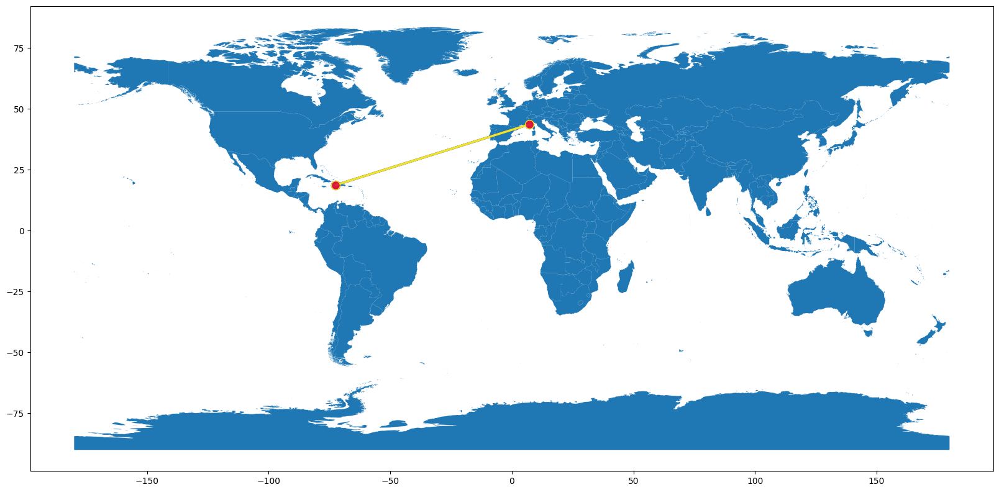

In [ ]:
url = "https://raw.githubusercontent.com/datasets/geo-countries/master/data/countries.geojson"

world = geopandas.read_file(url)
ax = world.plot(figsize=(20,20))

colors = cm.plasma(np.linspace(0, 1, len(real_locations_in_order) - 1))

for i in range(len(real_locations_in_order)-1):
    loc = real_locations_in_order[i]
    loc_next = real_locations_in_order[i+1]
    print(loc, loc_next)
    plt.plot(
        [loc["longitude"], loc_next["longitude"]],
        [loc["latitude"], loc_next["latitude"]],
        c=colors[i],
        linewidth=2.5,
        marker='o',
        markersize=10,
        markerfacecolor='crimson',
        alpha=0.9
    )
plt.show()

**Question 2:** Select a country's' statistic from the [World Development Indicators dataset](https://www.kaggle.com/datasets/kaggle/world-development-indicators) (Please notice there are several files in the dataset, such as _Indicators.csv_).
Then, create a choropleth map displaying how the selected statistics changed over time (15pt)
    
**Bonus:** Create a short animation that displays how the chosen statistics changed over time (15pt)

In [ ]:
path = kagglehub.dataset_download("kaggle/world-development-indicators")
print("Path to dataset files:", path)
indicators_df=pd.read_csv("datasets/kaggle/world-development-indicators/versions/2/Indicators.csv")
indicators_df.head()

Path to dataset files: /Users/guyarieli/Documents/אוניברסיטה/כריית נתונים במאגרי מידע גדולים/עבודות/datasets/kaggle/world-development-indicators/versions/2


,CountryName,CountryCode,IndicatorName,IndicatorCode,Year,Value
0,Arab World,ARB,"Adolescent fertility rate (births per 1,000 wo...",SP.ADO.TFRT,1960,1.335609e+02
1,Arab World,ARB,Age dependency ratio (% of working-age populat...,SP.POP.DPND,1960,8.779760e+01
2,Arab World,ARB,"Age dependency ratio, old (% of working-age po...",SP.POP.DPND.OL,1960,6.634579e+00
3,Arab World,ARB,"Age dependency ratio, young (% of working-age ...",SP.POP.DPND.YG,1960,8.102333e+01
4,Arab World,ARB,Arms exports (SIPRI trend indicator values),MS.MIL.XPRT.KD,1960,3.000000e+06


In [ ]:
indicator_name = "Birth rate, crude (per 1,000 people)"
filter_indicators_df = indicators_df[indicators_df.IndicatorName == indicator_name]
filter_indicators_df = filter_indicators_df[~filter_indicators_df.CountryCode.isin(['CHN', 'IND'])]
fig = px.choropleth(filter_indicators_df, locations="CountryCode",locationmode="ISO-3",
              color="Value",  animation_frame="Year", width=900, height=500)
fig.update_layout(title_text=f"Global  {indicator_name} from {filter_indicators_df.Year.min()} to {filter_indicators_df.Year.max()}", title_x=0.5)

**Question 3:** Use data from [the Meteorite Landings dataset](https://www.kaggle.com/datasets/nasa/meteorite-landings).
Create maps that present where the Meteorites landed and their mass. Additionally, draw choropleth map that give information how many different meteorites landed in each country and how it changes over the years (35pt).

In [85]:
path = kagglehub.dataset_download("nasa/meteorite-landings")

print("Path to dataset files:", path)
meteorite_df = pd.read_csv(f"{path}/meteorite-landings.csv", encoding='utf8')
meteorite_df.head()

Path to dataset files: /Users/guyarieli/Documents/אוניברסיטה/כריית נתונים במאגרי מידע גדולים/עבודות/datasets/nasa/meteorite-landings/versions/2


,name,id,nametype,recclass,mass,fall,year,reclat,reclong,GeoLocation
0,Aachen,1,Valid,L5,21.0,Fell,1880.0,50.77500,6.08333,"(50.775000, 6.083330)"
1,Aarhus,2,Valid,H6,720.0,Fell,1951.0,56.18333,10.23333,"(56.183330, 10.233330)"
2,Abee,6,Valid,EH4,107000.0,Fell,1952.0,54.21667,-113.00000,"(54.216670, -113.000000)"
3,Acapulco,10,Valid,Acapulcoite,1914.0,Fell,1976.0,16.88333,-99.90000,"(16.883330, -99.900000)"
4,Achiras,370,Valid,L6,780.0,Fell,1902.0,-33.16667,-64.95000,"(-33.166670, -64.950000)"


In [86]:
meteorite_df=meteorite_df[~meteorite_df.GeoLocation.isna()]
meteorite_df=meteorite_df[~meteorite_df.year.isna()]
meteorite_df=meteorite_df[~meteorite_df.mass.isna()]

In [ ]:

tiles = "https://stamen-tiles.a.ssl.fastly.net/terrain/{z}/{x}/{y}.png"
attr = "Map tiles by <a href='http://stamen.com'>Stamen Design</a>, " \
       "<a href='http://openstreetmap.org'>OpenStreetMap</a> contributors"

n_samples = 5000

center_lat = meteorite_df['reclat'].mean()
center_lon = meteorite_df['reclong'].mean()

folium_map = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=2,
    tiles=tiles,
    attr=attr
)

for _, row in meteorite_df.sample(n_samples).iterrows():
    tooltip = f"Location: ({row['reclat']}, {row['reclong']}), Mass: {row['mass']}"
    folium.Marker(
        location=[row['reclat'], row['reclong']],
        icon=folium.Icon(color='red', icon='info-sign'),
        popup=tooltip
    ).add_to(folium_map)

folium_map


In [ ]:
url = "https://naciscdn.org/naturalearth/110m/cultural/ne_110m_admin_0_countries.zip"
world = geopandas.read_file(url)
gdf = geopandas.GeoDataFrame(meteorite_df, geometry=geopandas.points_from_xy(meteorite_df.reclong, meteorite_df.reclat))
result = geopandas.sjoin(gdf, world, how='left')

group_meteorite_by_country_df = result.groupby(["ISO_A3","year"]).count().reset_index().sort_values("year")


fig = px.choropleth(group_meteorite_by_country_df, locations="ISO_A3",locationmode="ISO-3",
              color="mass", animation_frame="year", width=1000, height=800)
fig.update_layout(title_text=f"Global  meteorites landed from {group_meteorite_by_country_df.year.min()} to {group_meteorite_by_country_df.year.max()}", title_x=0.5)

/var/folders/b5/hwzjvd3s3t5cj85ybrswc01c0000gn/T/ipykernel_80600/2257128194.py:5: UserWarning:

CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326


